In [1]:
import torch
from omegaconf import OmegaConf
from torch.utils.data import random_split, DataLoader, Dataset, Subset
import time
from ldm.util import instantiate_from_config
from ldm.data.personalized import  PersonalizedBase
from ldm.models.diffusion.ddpm_edit import LatentDiffusion
from ldm.util import log_txt_as_img, exists, default, ismap, isimage, mean_flat, count_params, instantiate_from_config
import pdb
import torchvision
import numpy as np 
from PIL import Image
import os
import matplotlib.pyplot as plt

https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/sd_textual_inversion_training.ipynb#scrollTo=PIwPVPxBn0ht
https://arxiv.org/pdf/2312.02150.pdf
https://github.com/huggingface/diffusers/blob/64603389da01082055a901f2883c4810d1144edb/examples/instruct_pix2pix/train_instruct_pix2pix.py#L730
https://huggingface.co/docs/diffusers/training/instructpix2pix
https://leditsplusplus-project.static.hf.space/index.html
https://openaccess.thecvf.com/content/CVPR2023/papers/Tumanyan_Plug-and-Play_Diffusion_Features_for_Text-Driven_Image-to-Image_Translation_CVPR_2023_paper.pdf

mkdir -p models/ldm/stable-diffusion-v1/
wget -O models/ldm/stable-diffusion-v1/instruct-pix2pix-00-22000.ckpt http://instruct-pix2pix.eecs.berkeley.edu/instruct-pix2pix-00-22000.ckpt

In [35]:
## TODO: The model is in eval, try it on train? Look at cat images at each training step.
## Decrease the number of embeddings per token, decrease the learning rate from 5e-3 to 5e-5

In [118]:
#@markdown Add here the URLs to the images of the concept you are adding. 3-5 should be fine
urls = [
      "https://huggingface.co/datasets/valhalla/images/resolve/main/2.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/3.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/5.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/6.jpeg",
      ## You can add additional images here
]

In [119]:
#@title Download
import requests
import glob
from io import BytesIO
from PIL import Image
import os

def download_image(url):
  try:
    response = requests.get(url)
  except:
    return None
  return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_root_path = "data/cats"
if not os.path.exists(save_root_path):
  os.mkdir(save_root_path)
[image.save(f"{save_root_path}/cat{i+1}.png") for i, image in enumerate(images)]

save_edit_path = "data/catsreddot"
if not os.path.exists(save_edit_path):
  os.mkdir(save_edit_path)
[image.save(f"{save_edit_path}/cat{i+1}.png") for i, image in enumerate(images)]

[None, None, None, None]

In [2]:
'''

global vars, consider making a script to set these
'''
ckpt = 'models/ldm/stable-diffusion-v1/instruct-pix2pix-00-22000.ckpt'
yml_paths = ['configs/latent-diffusion/instructpix2pix.yaml', ]
data_root = 'data/vases'
edit_root = 'reddot'
output_path = "results/" + data_root.split("/")[-1] + "_" + edit_root
if not os.path.isdir(output_path):
    os.mkdir(output_path)
device=0

In [3]:
'''
helper functions
'''
def load_model_from_config(config, ckpt, verbose=False):
    print(f"Loading model from {ckpt}")

    pl_sd = torch.load(ckpt, map_location="cpu")
    sd = pl_sd["state_dict"]
    config.model.params.ckpt_path = ckpt
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    if len(m) > 0 and verbose:
        print("missing keys:")
        print(m)
    if len(u) > 0 and verbose:
        print("unexpected keys:")
        print(u)

    return model

def set_lr(model, config):
    # configure learning rate
    bs, base_lr = config.data.params.batch_size, config.model.base_learning_rate
    accumulate_grad_batches = 1
    ngpu = 1

    model.learning_rate = accumulate_grad_batches * ngpu * bs * base_lr
    print(
        "Setting learning rate to {:.2e} = {} (accumulate_grad_batches) * {} (num_gpus) * {} (batchsize) * {:.2e} (base_lr)".format(
            model.learning_rate, accumulate_grad_batches, ngpu, bs, base_lr))



In [4]:
'''
initialize model
'''
# load omega conf
config_paths = [OmegaConf.load(cfg) for cfg in yml_paths]
dummy = OmegaConf.from_dotlist([])
model_config = OmegaConf.merge(*config_paths, dummy)
train_config = model_config.pop("lightning", OmegaConf.create())
# trainer_config = train_parameters.get("trainer", OmegaConf.create())
model: LatentDiffusion = load_model_from_config(model_config, ckpt)
model = model.eval().to(device)

Loading model from models/ldm/stable-diffusion-v1/instruct-pix2pix-00-22000.ckpt
ldm.models.diffusion.ddpm_edit
LatentDiffusion: Running in eps-prediction mode
ldm.modules.diffusionmodules.openaimodel
DiffusionWrapper has 859.53 M params.
ldm.models.autoencoder
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
torch.nn
ldm.modules.encoders.modules


Downloading: "https://github.com/DagnyT/hardnet/raw/master/pretrained/train_liberty_with_aug/checkpoint_liberty_with_aug.pth" to /root/.cache/torch/hub/checkpoints/checkpoint_liberty_with_aug.pth
100%|██████████| 5.10M/5.10M [00:00<00:00, 71.1MB/s]


Downloading:   0%|          | 0.00/939k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/512k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/905 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.41k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.59G [00:00<?, ?B/s]

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.14.layer_norm1.weight', 'vision_model.encoder.layers.9.self_attn.v_proj.weight', 'vision_model.encoder.layers.1.layer_norm1.weight', 'vision_model.encoder.layers.18.layer_norm1.bias', 'vision_model.encoder.layers.22.layer_norm1.bias', 'vision_model.encoder.layers.12.self_attn.v_proj.bias', 'vision_model.encoder.layers.13.layer_norm2.weight', 'vision_model.embeddings.position_ids', 'vision_model.encoder.layers.19.mlp.fc1.weight', 'vision_model.encoder.layers.18.layer_norm2.weight', 'vision_model.encoder.layers.13.self_attn.v_proj.bias', 'vision_model.encoder.layers.5.self_attn.out_proj.bias', 'vision_model.encoder.layers.18.self_attn.out_proj.weight', 'vision_model.encoder.layers.16.mlp.fc1.bias', 'vision_model.encoder.layers.18.layer_norm1.weight', 'vision_model.encoder.layers.5.self_attn.v_proj.bias', 'vision_model.encoder.layers.7.layer_no

ldm.modules.embedding_manager
Restored from models/ldm/stable-diffusion-v1/instruct-pix2pix-00-22000.ckpt with 3 missing and 688 unexpected keys
Missing Keys: ['parametersdiff', 'embedding_manager.string_to_param_dict.*', 'embedding_manager.initial_embeddings.*']
Unexpected Keys: ['model_ema.decay', 'model_ema.num_updates', 'model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_laye

In [22]:
'''
create dataloader
'''
data_root = 'data/headshot'
data_eval_root = 'data/headshoteval'
edit_root = 'hat'
model_config.data.params.train.params.data_root = data_root
model_config.data.params.validation.params.data_root = data_eval_root

model_config.data.params.train.params.edit_root = edit_root
model_config.data.params.validation.params.edit_root = edit_root

# annoying that we have to use lightning here
# (can do another way but will take more code)
# its ok, we just grab the dataloader from this
data = instantiate_from_config(model_config.data)
data.prepare_data()
data.setup()
train_loader = data._train_dataloader()
val_loader = data._val_dataloader()

raw_batch = next(iter(train_loader))
#torch.manual_seed(0)
noise=None
raw_batch['edited'] = raw_batch['edited'].to(device)
raw_batch['image'] = raw_batch['image'].to(device)
raw_batch['caption'] = ['*']*raw_batch['image'].shape[0]

raw_eval_batch = next(iter(val_loader))
#torch.manual_seed(0)
noise=None
raw_eval_batch['edited'] = raw_eval_batch['edited'].to(device)
raw_eval_batch['image'] = raw_eval_batch['image'].to(device)
raw_eval_batch['caption'] = ['*']*raw_eval_batch['image'].shape[0]

main
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized


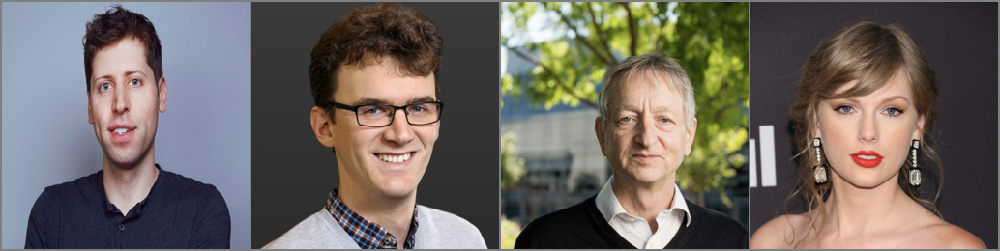

In [23]:
out = raw_eval_batch['image'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
# im.save("eval.jpg")
im

In [9]:
set_lr(model, model_config)
embedding_params = list(model.embedding_manager.embedding_parameters())#[self.parametersdiff]
num=100
#model.embedding_manager.load("embeddings/purple/embedding_" + str(num) + ".pt")
optimizer = torch.optim.AdamW(embedding_params, lr=model.learning_rate)

Setting learning rate to 8.00e-02 = 1 (accumulate_grad_batches) * 1 (num_gpus) * 16 (batchsize) * 5.00e-03 (base_lr)


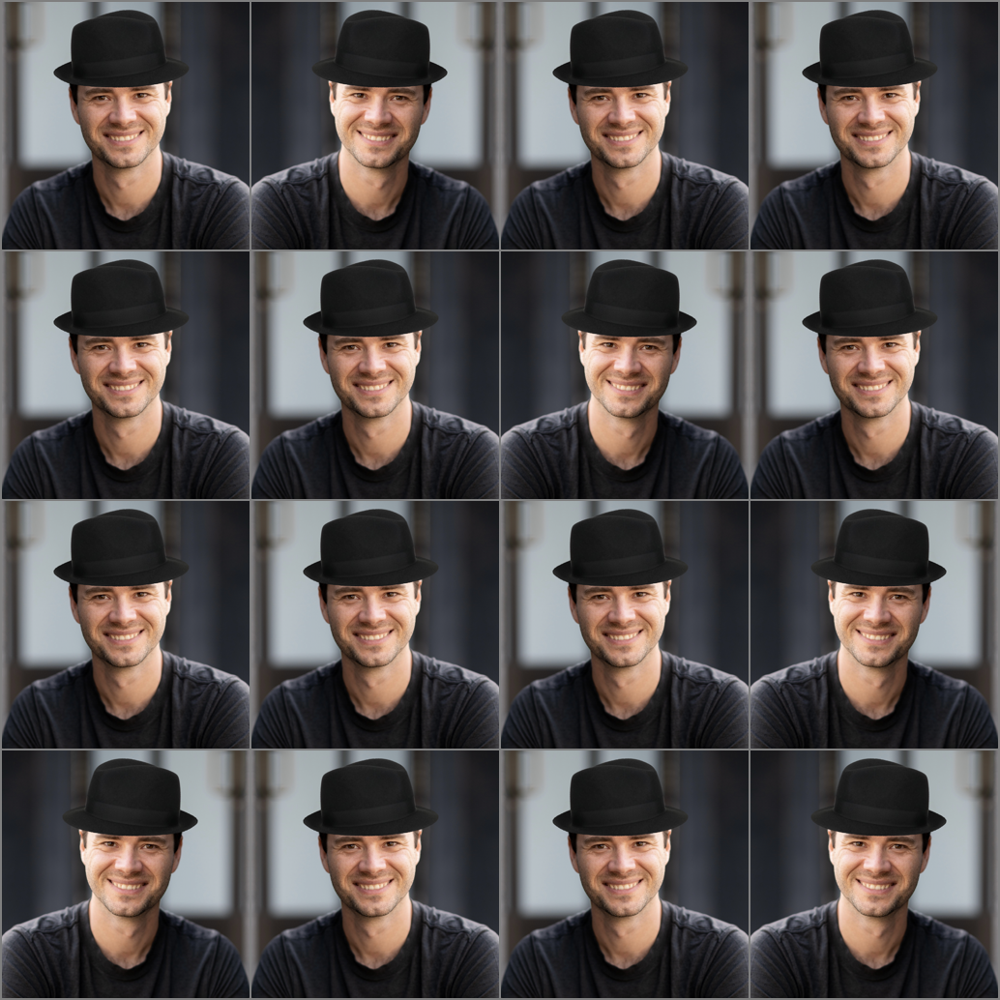

In [24]:
out = raw_batch['edited'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
# im.save("train_output.jpg")
im

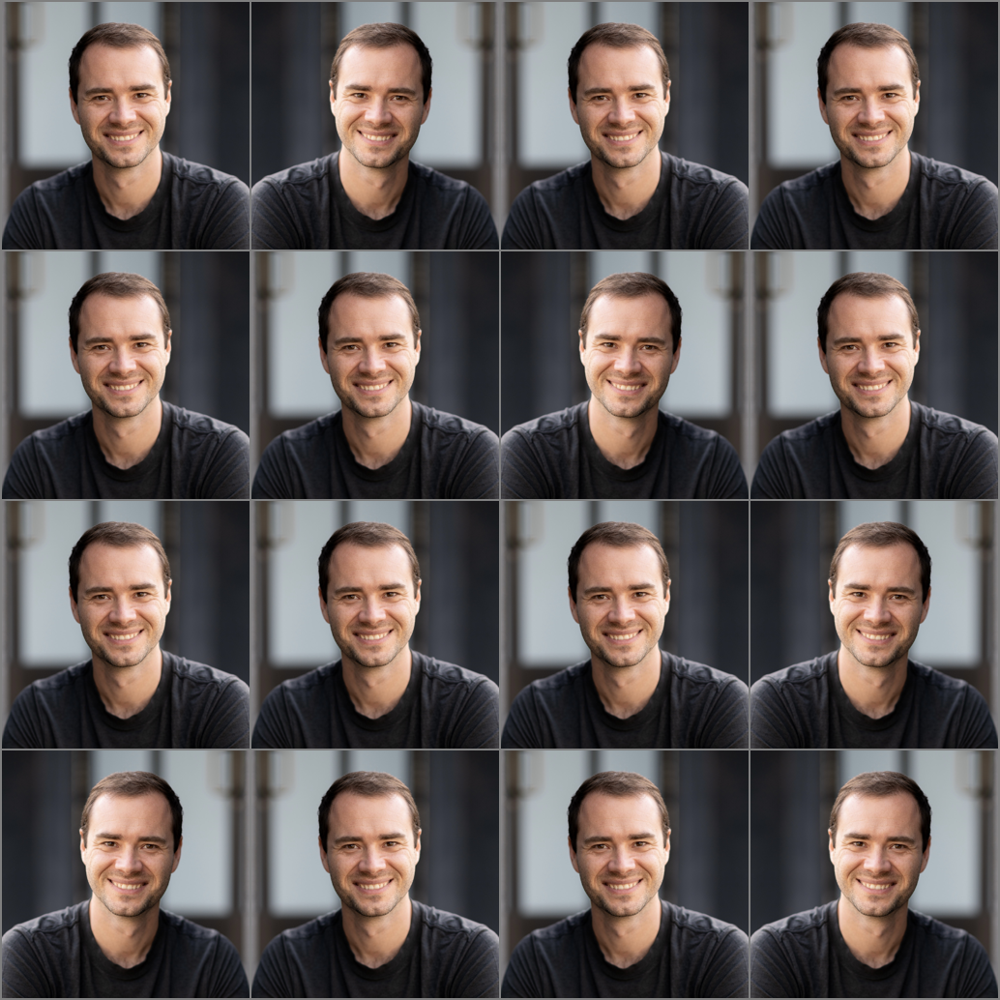

In [25]:
out = raw_batch['image'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
im
# im.save("train_input.jpg")
im

In [23]:
model.get_input

<bound method LatentDiffusion.get_input of LatentDiffusion(
  (model): DiffusionWrapper(
    (diffusion_model): UNetModel(
      (time_embed): Sequential(
        (0): Linear(in_features=320, out_features=1280, bias=True)
        (1): SiLU()
        (2): Linear(in_features=1280, out_features=1280, bias=True)
      )
      (input_blocks): ModuleList(
        (0): TimestepEmbedSequential(
          (0): Conv2d(8, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (1-2): 2 x TimestepEmbedSequential(
          (0): ResBlock(
            (in_layers): Sequential(
              (0): GroupNorm32(32, 320, eps=1e-05, affine=True)
              (1): SiLU()
              (2): Conv2d(320, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            )
            (h_upd): Identity()
            (x_upd): Identity()
            (emb_layers): Sequential(
              (0): SiLU()
              (1): Linear(in_features=1280, out_features=320, bias=True)
            )
       

In [24]:
batch = model.get_input(raw_batch, 'edited')

In [37]:
batch[1].keys()

dict_keys(['c_crossattn', 'c_concat'])

In [39]:
model.cond_stage_key

'caption'

In [154]:
image1= cv2.imread("data/headshot3/headshot4.png", cv2.IMREAD_UNCHANGED)
image1.shape
image_without_alpha1 = image1[:, :, :3]
cv2.imwrite("data/headshot3/headshot4.png", image_without_alpha1)

(600, 604, 4)

In [151]:
# import cv2

# # Read the image with alpha channel
image1 = cv2.imread("data/headshoteval/headshot1.png", cv2.IMREAD_UNCHANGED)
image2 = cv2.imread("data/headshoteval/headshot2.png", cv2.IMREAD_UNCHANGED)
image3 = cv2.imread("data/headshoteval/headshot3.png", cv2.IMREAD_UNCHANGED)
image4 = cv2.imread("data/headshoteval/headshot4.png", cv2.IMREAD_UNCHANGED)

# # Read the image with alpha channel
# image1 = cv2.imread("data/headshot3/headshot4.png", cv2.IMREAD_UNCHANGED)
# # image2 = cv2.imread("data/headshothat/headshot2.png", cv2.IMREAD_UNCHANGED)
# # image3 = cv2.imread("data/headshothat/headshot3.png", cv2.IMREAD_UNCHANGED)
print(image1.shape)
print(image2.shape)
print(image3.shape)
print(image4.shape)
# # Remove the alpha channel
image_without_alpha1 = image1[:, :, :3]
image_without_alpha2 = image2[:, :, :3]
image_without_alpha3 = image3[:, :, :3]
image_without_alpha4 = image4[:, :, :3]
# # Save the image without alpha
cv2.imwrite("data/headshoteval/headshot1.png", image_without_alpha1)
cv2.imwrite("data/headshoteval/headshot2.png", image_without_alpha2)
cv2.imwrite("data/headshoteval/headshot3.png", image_without_alpha3)
cv2.imwrite("data/headshoteval/headshot4.png", image_without_alpha4)

image1 = cv2.imread("data/headshoteval/headshot1.png", cv2.IMREAD_UNCHANGED)
image2 = cv2.imread("data/headshoteval/headshot2.png", cv2.IMREAD_UNCHANGED)
image3 = cv2.imread("data/headshoteval/headshot3.png", cv2.IMREAD_UNCHANGED)
image4 = cv2.imread("data/headshoteval/headshot4.png", cv2.IMREAD_UNCHANGED)

print(image1.shape)
print(image2.shape)
print(image3.shape)
print(image4.shape)

(526, 700, 3)
(1018, 1022, 3)
(1274, 1290, 3)
(1056, 1064, 3)
(526, 700, 3)
(1018, 1022, 3)
(1274, 1290, 3)
(1056, 1064, 3)


In [37]:
print(batch[0].shape)
# ['c_crossattn', 'c_concat']
print(batch[1]['c_crossattn'][0].shape)
print(batch[1]['c_concat'][0].shape)

torch.Size([4, 4, 32, 32])
torch.Size([4, 77, 768])
torch.Size([4, 4, 32, 32])


In [47]:
print(batch[0].shape)
print(default(noise, lambda: torch.randn_like(batch[0])).to(device).shape)
print(torch.randn_like(batch[0]).shape)

torch.Size([4, 4, 32, 32])
torch.Size([16, 4, 32, 32])
torch.Size([4, 4, 32, 32])


In [48]:
for j,raw_batch in enumerate(train_loader):
    print("iteration: ", i,"example in training set #: ", j)
    x_start = raw_batch['edited']
    raw_batch['edited'] = raw_batch['edited'].to(device)
    raw_batch['image'] = raw_batch['image'].to(device)
    #raw_batch['caption'] = ['make the statue purple']*raw_batch['image'].shape[0]
    newbatch = model.get_input(raw_batch, 'edited')
    #raw_batch['caption'] = ['make the statue *']*raw_batch['image'].shape[0]
    raw_batch['caption'] = ['*']*raw_batch['image'].shape[0]
    batch = model.get_input(raw_batch, 'edited')

    # calls p_losses
    noise = torch.randn_like(batch[0]).to(device)

    print(batch[0].shape)
    # ['c_crossattn', 'c_concat']
    print(batch[1]['c_crossattn'][0].shape)
    print(batch[1]['c_concat'][0].shape)
    print(noise.shape)
    print(j)
    t = torch.randint(0, 1000, (batch[0].shape[0],)).long().to('cuda')
    loss, loss_dict = model(batch[0], batch[1],t, noise)

iteration:  0 example in training set #:  0
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
0
iteration:  0 example in training set #:  1
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
1
iteration:  0 example in training set #:  2
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
2
iteration:  0 example in training set #:  3
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
3
iteration:  0 example in training set #:  4
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
4
iteration:  0 example in training set #:  5
torch.Size([16, 4, 32, 32])
torch.Size([16, 77, 768])
torch.Size([16, 4, 32, 32])
torch.Size([16, 4, 32, 32])
5
iteration:  0 example in training set #:  6
torch.Size([4, 4, 32

0 iteration
iteration:  0 example in training set #:  0
loss:  tensor(0.0471, device='cuda:0', grad_fn=<AddBackward0>)


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

iteration:  0 example in training set #:  1
loss:  tensor(0.0432, device='cuda:0', grad_fn=<AddBackward0>)
iteration:  0 example in training set #:  2
loss:  tensor(0.0737, device='cuda:0', grad_fn=<AddBackward0>)
iteration:  0 example in training set #:  3
loss:  tensor(0.0734, device='cuda:0', grad_fn=<AddBackward0>)
iteration:  0 example in training set #:  4
loss:  tensor(0.0701, device='cuda:0', grad_fn=<AddBackward0>)
iteration:  0 example in training set #:  5
loss:  tensor(0.0389, device='cuda:0', grad_fn=<AddBackward0>)
iteration:  0 example in training set #:  6


Exception ignored in: <function _ConnectionBase.__del__ at 0x7fa45ec0aa70>
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 132, in __del__
    self._close()
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


RuntimeError: The size of tensor a (4) must match the size of tensor b (16) at non-singleton dimension 0

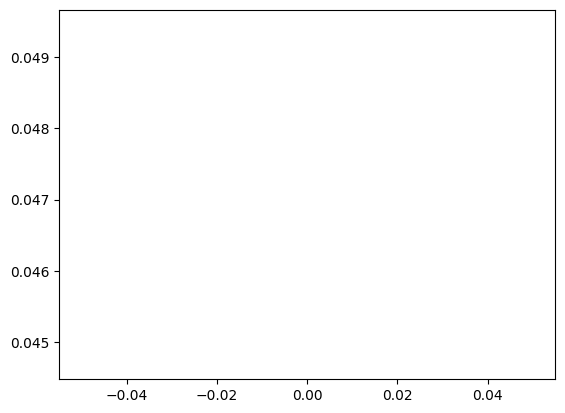

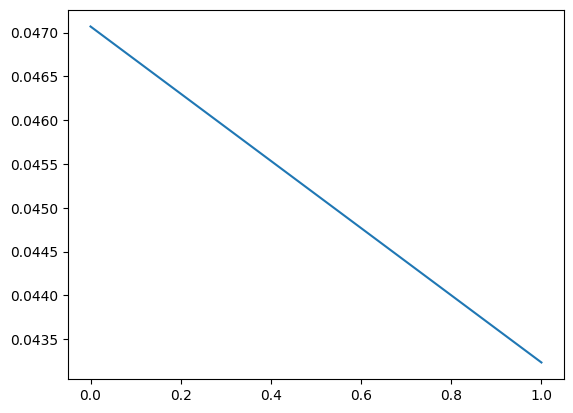

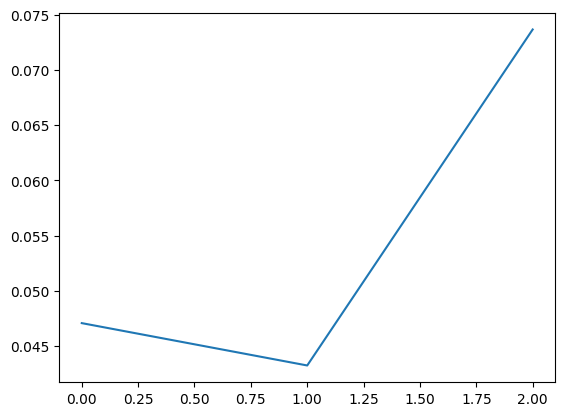

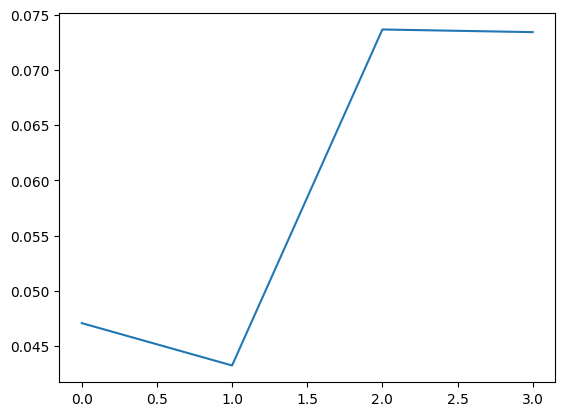

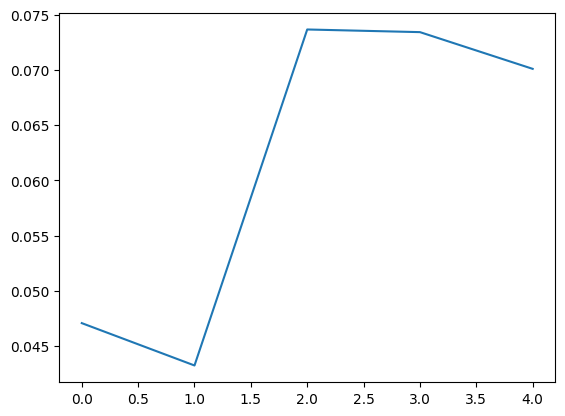

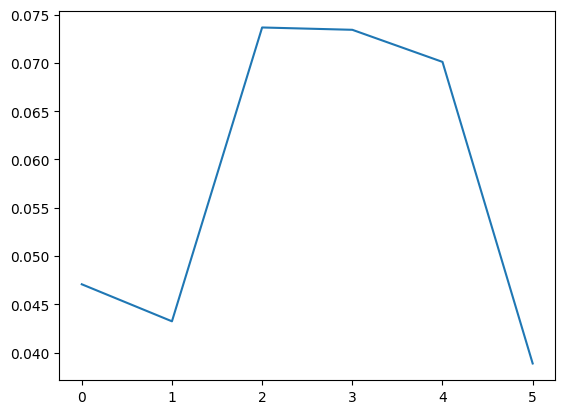

In [26]:
thestring="trilbyhat"
if not os.path.isdir(output_path +"/" + thestring):
    os.mkdir(output_path +"/" + thestring)
cur = time.time()
themean = 0.0
thelist=[]
for i in range(6):
    print(i, "iteration")
    for j,raw_batch in enumerate(train_loader):
        print("iteration: ", i,"example in training set #: ", j)
        x_start = raw_batch['edited']
        raw_batch['edited'] = raw_batch['edited'].to(device)
        raw_batch['image'] = raw_batch['image'].to(device)
        #raw_batch['caption'] = ['make the statue purple']*raw_batch['image'].shape[0]
        newbatch = model.get_input(raw_batch, 'edited')
        #raw_batch['caption'] = ['make the statue *']*raw_batch['image'].shape[0]
        raw_batch['caption'] = ['*']*raw_batch['image'].shape[0]
        batch = model.get_input(raw_batch, 'edited')

        optimizer.zero_grad()
        
        # calls p_losses
        # noise = default(noise, lambda: torch.randn_like(batch[0])).to(device)
        noise = torch.randn_like(batch[0]).to(device)
        t = torch.randint(0, 1000, (batch[0].shape[0],)).long().to('cuda')
        loss, loss_dict = model(batch[0], batch[1],t, noise)
        print("loss: ", loss)
        if not os.path.isdir(output_path + "/embeddings/"):
            os.mkdir(output_path + "/embeddings/")
        if not os.path.isdir(output_path + "/embeddings/" + thestring):
            os.mkdir(output_path + "/embeddings/" + thestring)
        model.embedding_manager.save(output_path + "/" +  "embeddings/" + thestring + "/embedding_" + str(i) + ".pt")
        if i%1==0 and j%100==0:
            # out = raw_batch['edited'].detach().cpu().permute(0,3,1,2)
            # grid = torchvision.utils.make_grid(out, nrow=4)
            # grid = (grid + 1.0) / 2.0 
            # grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
            # grid = grid.numpy()
            # grid = (grid * 255).astype(np.uint8)
            # im = Image.fromarray(grid)
            #filename = 'rawedited' + str(i) + ".jpg"
            #im.save(output_path + filename)

            if not os.path.isdir(output_path + "/" + thestring):
                os.mkdir(output_path + "/" +thestring)

            if not os.path.isdir(output_path + "/" + thestring + "/" + str(i)):
                os.mkdir(output_path + "/" +thestring + "/" + str(i))

            if not os.path.isdir(output_path + "/" + thestring + "/" + str(i) + "/" + str(j) + "/"):
                os.mkdir(output_path + "/" +thestring + "/" + str(i) + "/" +str(j) + "/")
    
            log = model.log_images(7.5, 1.5, raw_batch)
            log_eval = model.log_images(7.5, 1.5, raw_eval_batch)
            key ='samples'
            log[key] = torch.clamp(log[key].detach().cpu(),-1.,1)
            grid = torchvision.utils.make_grid(log[key], nrow=4)
            grid = (grid + 1.0) / 2.0 
            grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
            grid = grid.numpy()
            grid = (grid * 255).astype(np.uint8)
            im = Image.fromarray(grid)
            filename = str(loss.item()) + "_" + str(key) + "_" + str(j) + "_" + str(log["txt_scale"]) + \
            "_" + str(log["image_scale"]) + ".jpg"
            #pdb.set_trace()
            im.save(output_path + "/" + thestring + "/" + str(i) + "/" + str(j) + "/" + filename)
            #pdb.set_trace()

            log_eval[key] = torch.clamp(log_eval[key].detach().cpu(),-1.,1)
            grid = torchvision.utils.make_grid(log_eval[key], nrow=4)
            grid = (grid + 1.0) / 2.0 
            grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
            grid = grid.numpy()
            grid = (grid * 255).astype(np.uint8)
            im = Image.fromarray(grid)
            filename = str(loss.item()) + "_" + "eval" + "_" + str(j) + "_" + str(log["txt_scale"]) + \
            "_" + str(log["image_scale"]) + ".jpg"
            im.save(output_path + "/" + thestring + "/" + str(i) + "/" + str(j) + "/" + filename)
            #pdb.set_trace()
            
            
        #print(loss)
        
        
        thelist.append(loss.item())
        plt.figure()
        plt.plot(np.arange(0,len(thelist)),thelist)
        plt.savefig(output_path  + "/" + thestring + "/" + "currentloss.png")
        loss.backward()
        optimizer.step()
        #print(loss, "here")

        if model.use_scheduler:
            lr = model.optimizers().param_groups[0]['lr']
            model.log('lr_abs', lr, prog_bar=True, logger=True, on_step=True, on_epoch=False)

        new = time.time()

# pdb.set_trace()



In [34]:
raw_batch['caption'] = ['make it a cartoon']*raw_batch['image'].shape[0]
log = model.log_images(7.5, 1.5, raw_batch)
key ='samples'
log[key] = torch.clamp(log[key].detach().cpu(),-1.,1)
grid = torchvision.utils.make_grid(log[key], nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

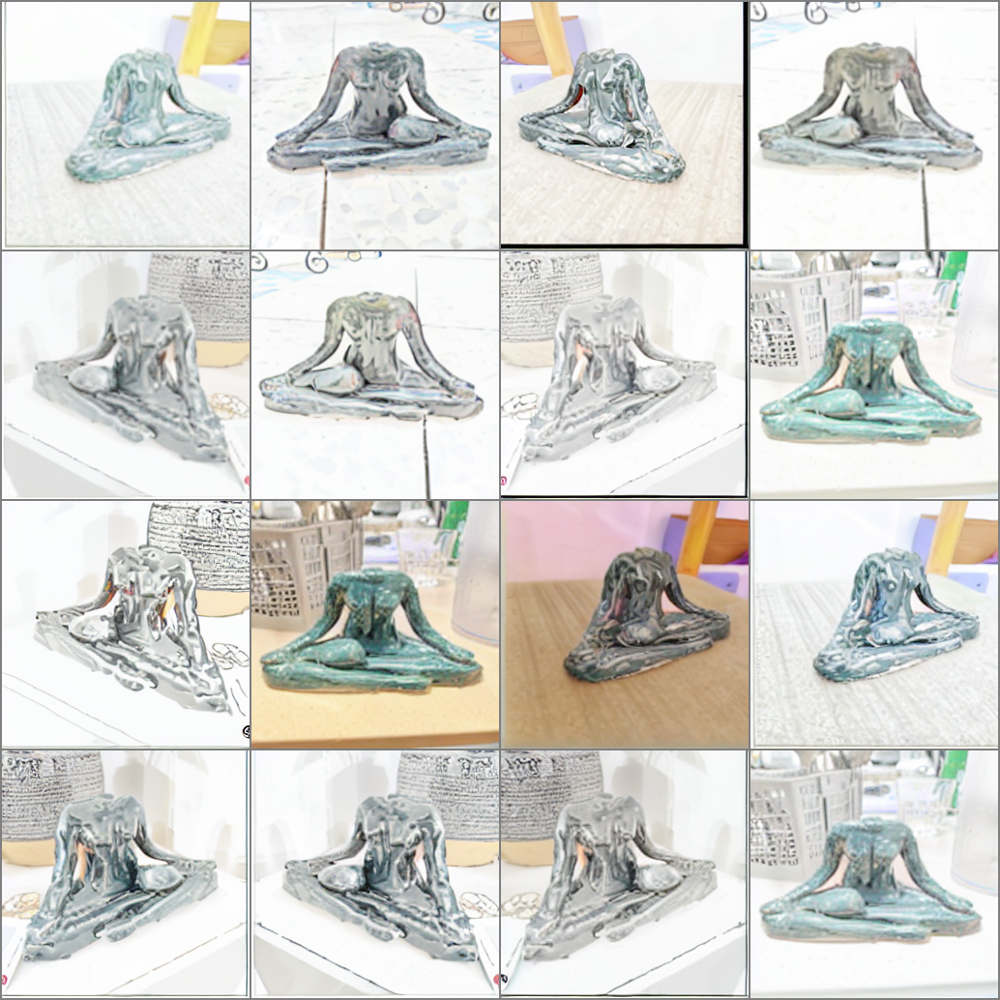

In [35]:
im

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

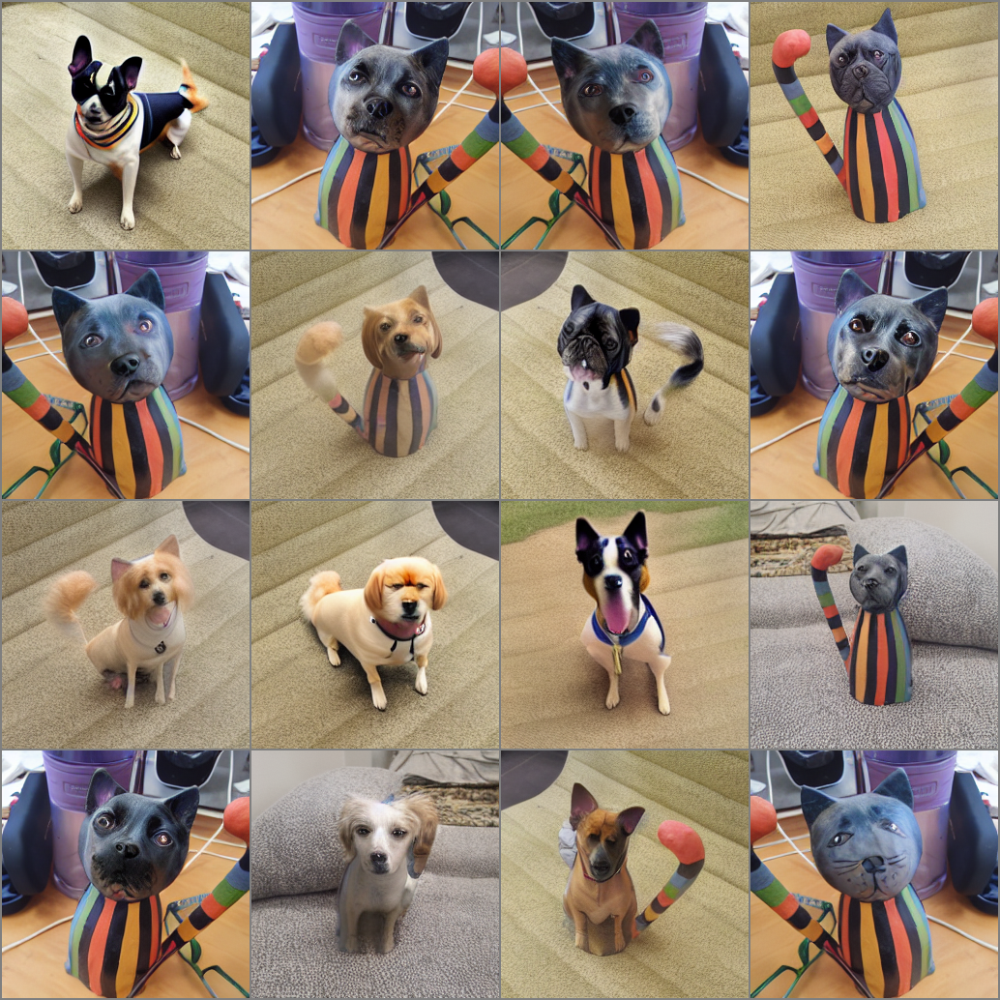

In [31]:
raw_cat_batch['caption'] = ['make it a dog']*raw_cat_batch['image'].shape[0]
log = model.log_images(7.5, 1.5, raw_cat_batch)
key ='samples'
log[key] = torch.clamp(log[key].detach().cpu(),-1.,1)
grid = torchvision.utils.make_grid(log[key], nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
im

main
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized
main
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized
ldm.data.personalized


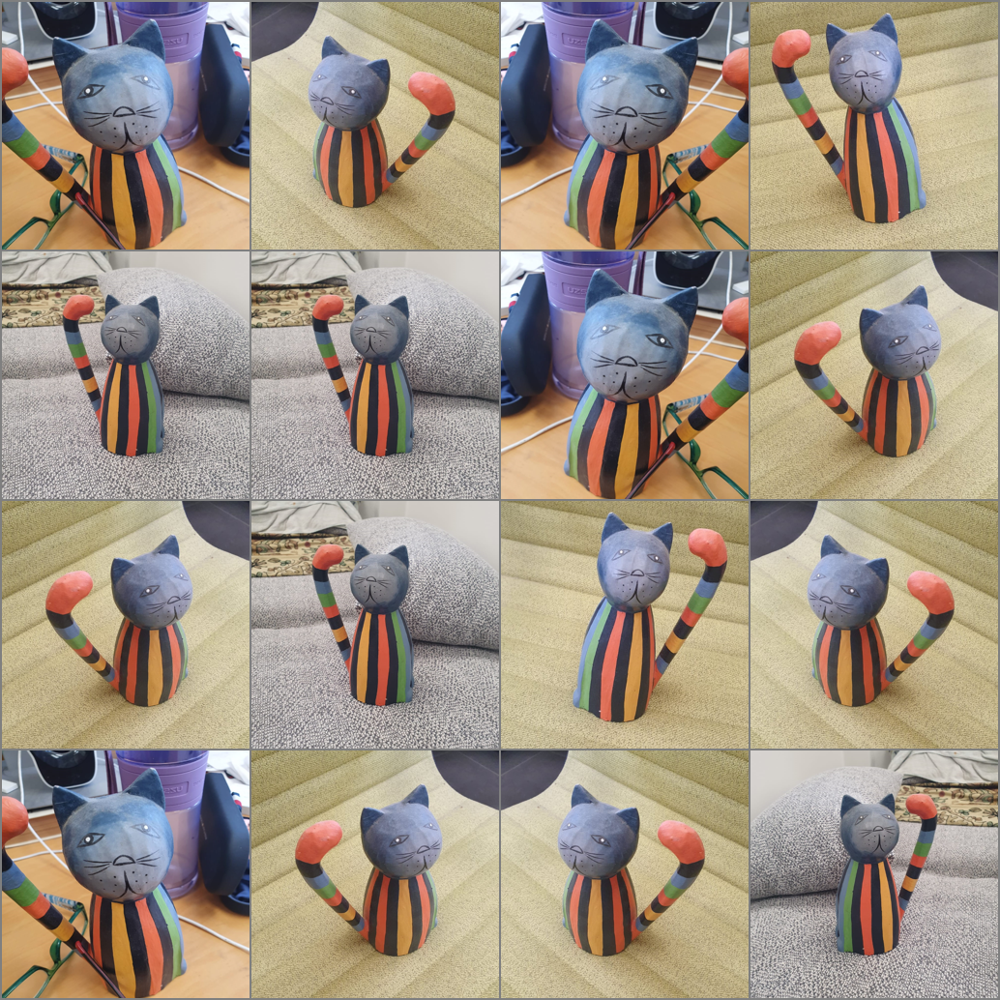

In [52]:
'''
create dataloader
'''
data_root = 'data/cats'
edit_root = 'reddot'
model_config.data.params.train.params.data_root = data_root
model_config.data.params.validation.params.data_root = data_root

model_config.data.params.train.params.edit_root = edit_root
model_config.data.params.validation.params.edit_root = edit_root

# annoying that we have to use lightning here
# (can do another way but will take more code)
# its ok, we just grab the dataloader from this
data = instantiate_from_config(model_config.data)
data.prepare_data()
data.setup()
train_loader = data._train_dataloader()
data = instantiate_from_config(model_config.data)
data.prepare_data()
data.setup()
train_loader = data._train_dataloader()
raw_batch = next(iter(train_loader))
#torch.manual_seed(0)
noise=None
raw_batch['edited'] = raw_batch['edited'].to(device)
raw_batch['image'] = raw_batch['image'].to(device)
raw_batch['caption'] = ['*']*raw_batch['image'].shape[0]
out = raw_batch['image'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
im

In [51]:
!rm -r data/cats/.ipynb_checkpoints

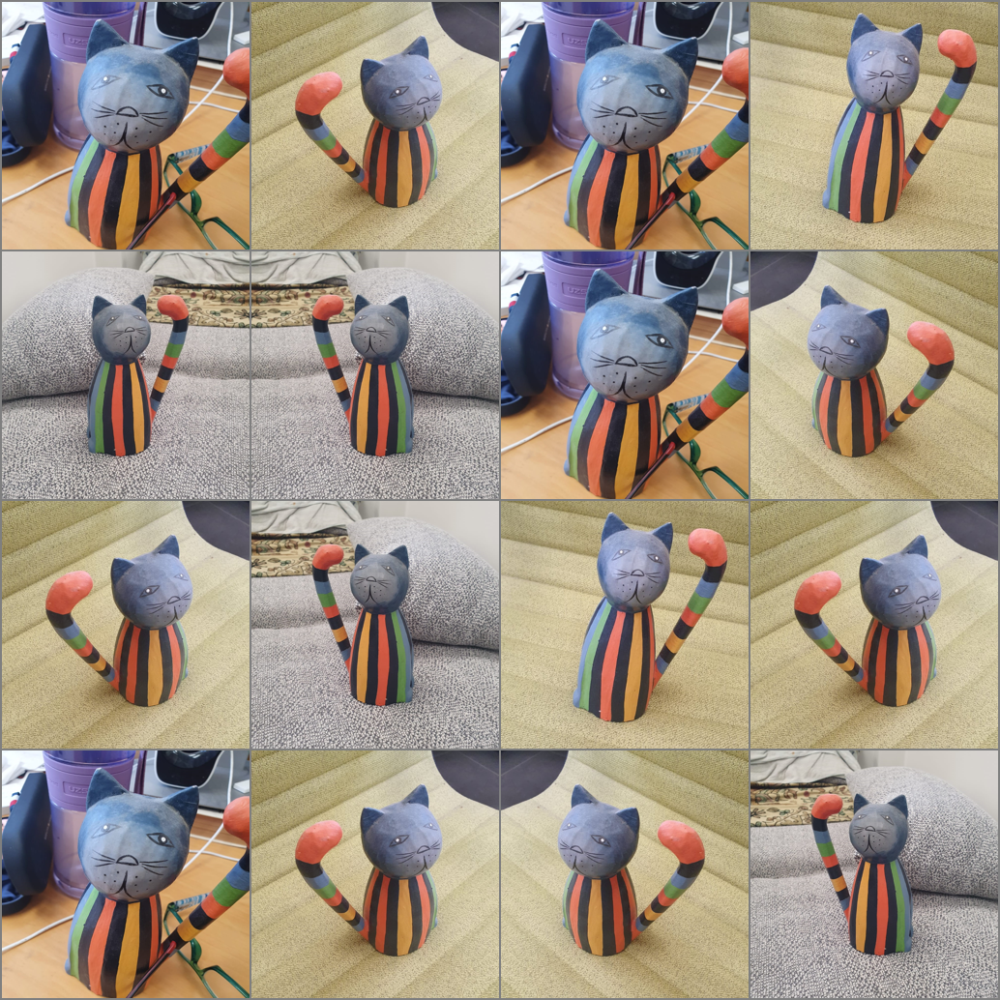

In [59]:
raw_batch['edited'] = raw_batch['edited'].to(device)
raw_batch['image'] = raw_batch['image'].to(device)
raw_batch['caption'] = ['make it a dog']*raw_batch['image'].shape[0]
out = raw_batch['edited'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
im

In [60]:
log = model.log_images(7.5, 1.5, raw_batch)
key ='samples'
log[key] = torch.clamp(log[key].detach().cpu(),-1.,1)
grid = torchvision.utils.make_grid(log[key], nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

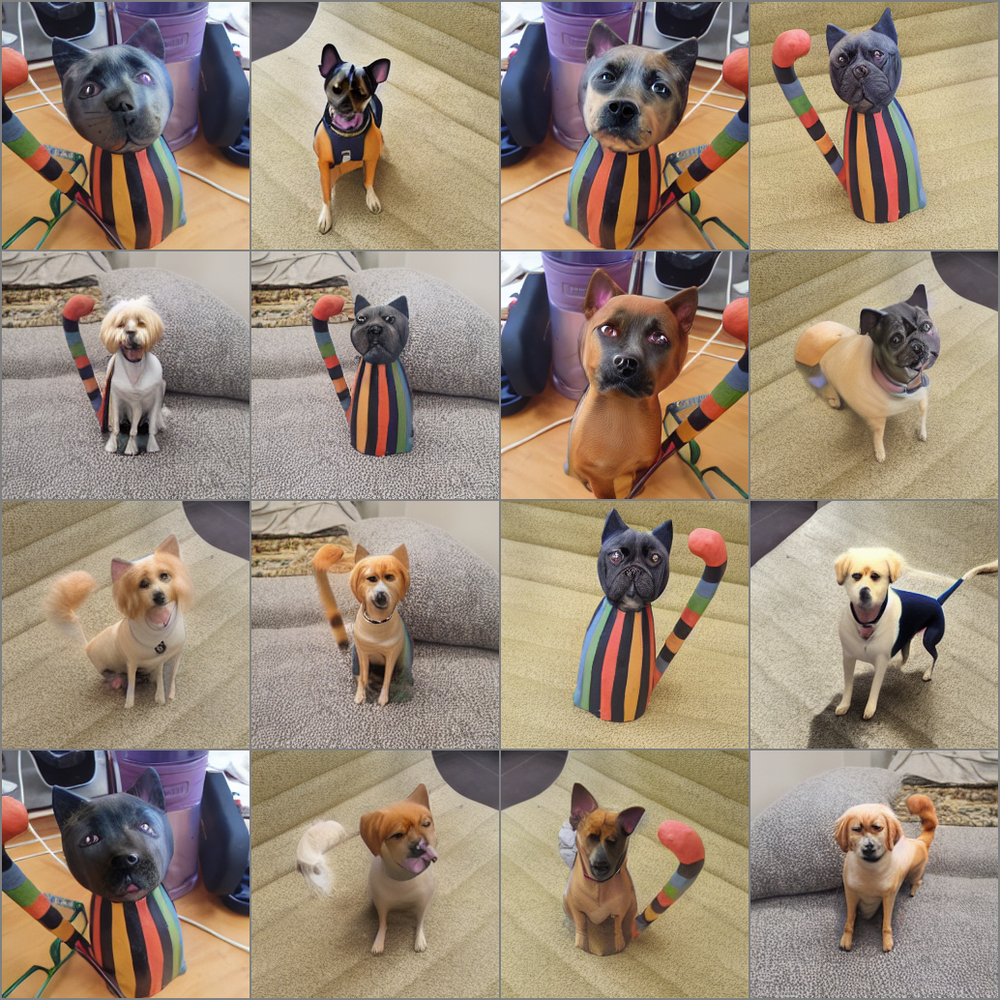

In [61]:
im

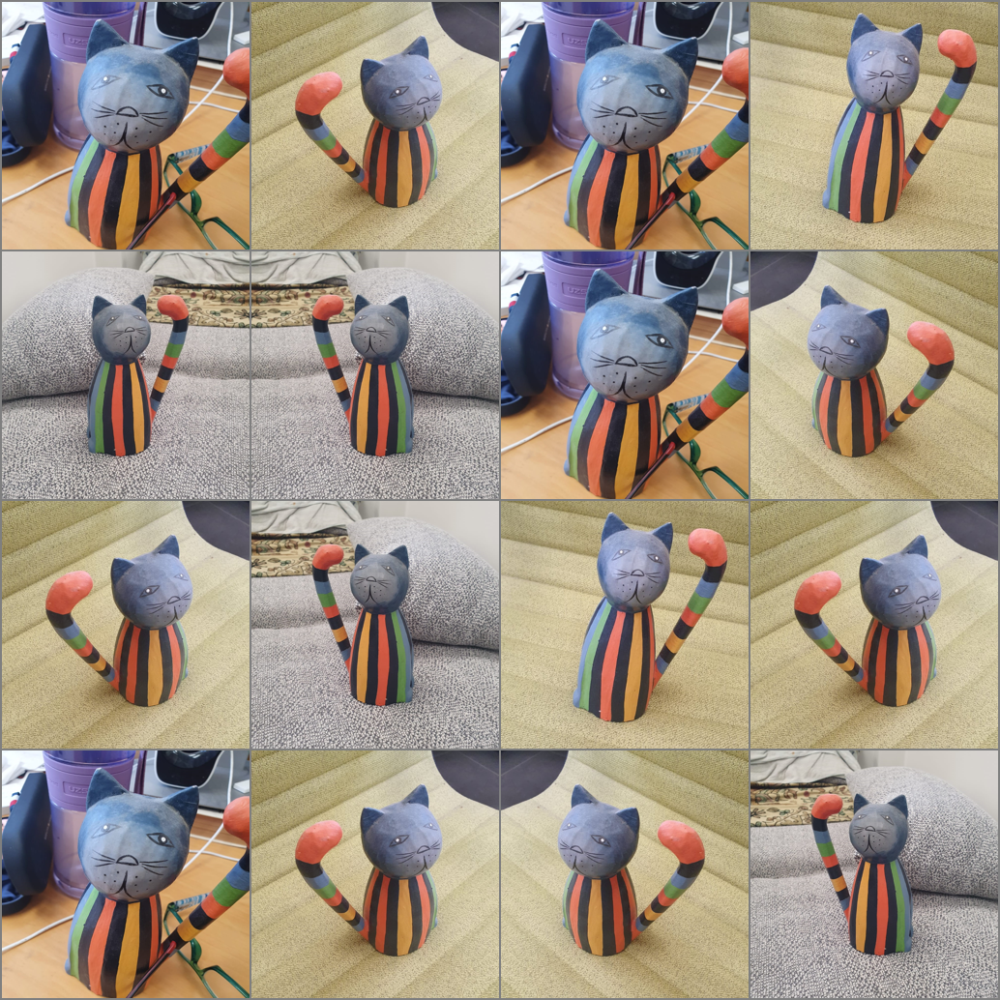

In [56]:
raw_batch['edited'] = raw_batch['edited'].to(device)
raw_batch['image'] = raw_batch['image'].to(device)
raw_batch['caption'] = ['*']*raw_batch['image'].shape[0]
out = raw_batch['edited'].detach().cpu().permute(0,3,1,2)
grid = torchvision.utils.make_grid(out, nrow=4)
grid = (grid + 1.0) / 2.0 
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)
im = Image.fromarray(grid)
im